# Final Project

### Creative Applications of Deep Learning with Google's Tensorflow | Parag K. Mital | Kadenze, Inc. ###

My final project for the first part of this course (CADL I) will consist in creating an application to wear eyeglasses or hats to people without glasses or hats, using DCGAN and hat or/and eyeglass vectors.
Indeed, the VGG model we used during the course does not always return a true eyeglasses or hats when the label is fixed to 'True'. For example see below 'the problem of true label with the VGG model'. We can easily remark that on a sample of 64 images with eyeglasses label set to 'True' only 2 people wear true glasses.

So, to improve the effect I plan to proceed like below to put glasses (or hats) to people :
        - 1)- Create a dataset of faces with glasses (or hats) only (the celeb dataset does not always give faces with true glasses for the 'Eyeglasses' label fixed to 'True')
        - 2)- Create another one for faces with no glasses (or hats) only
        - 3)- Generate a mean image (of each) using the "get_features_for" function but applied to the new 2 datasets, not to the Celeb
        - 4)- Create the glass (or hat) vector using the generated mean, this should allow to remove or put glasses (or hat) on faces.
To execute all sections of this final project you will need to download on the notebook directory :
- The Celeb dataset we used during the course (1.31 Go) or if you want at least 200 images from the dataset
- The VGG model we used during the course (about 500 Mo)
- The **/libs** directory in the session 5; indeed I also reuse or adapt some functions to reach the goal I am trying to reach here. Each time I do it, I will precise what I do.

I also join the **/FacesWithGlasses** and **/FacesWithHats** directories I created for the required sections. You could compose your own if you understand well. I will try to be as so clear as possible to allow that.
 

# Table of Contents

- [I- VGG model label verification](#vgg_verification)
 
- [II- New datasets building](#new_dataset_building)
    - [II.1- Eyeglasses dataset](#eyeglasses_dataset)
    - [II.2- Hats dataset](#hats_dataset)
 
- [III- Feature function creation](#Feature_function_creation)
    - [III.1- Creating a session for the VGG Model](#vgg_session_creation)
    - [III.2- Creating placeholders from the VGG Model](#vgg_model_placeholders)
    - [III.3- Creating a new 'get_features_for' function](#new_get_features_for)
        - [III.3.1- Generated eyeglasses feature](#generated_eyeglasses_feature)
        - [III.3.2- Generated hats feature](#generated_hats_feature)
        - [III.3.3- Generated mean face from the celeb dataset](#generated_mean_face)


- [IV- Putting features on faces](#features_on_faces)
    - [IV.1- Using the whole celeb dataset images](#on_whole_dataset)
        - [IV.1.1- For the eyeglasses feature](#put_eyeglasses_feature)
        - [IV.1.2- For the hats feature](#put_hats_feature)

    - [IV.2- Using only one image](#only_one_image)
        - [IV.2.1- For the eyeglasses feature](#only_one_image_eyeglasses_feature)
        - [IV.2.2- For both the eyeglasses and hats features](#both_eyeglasses_hats_feature)
        - [IV.2.3- An example with my own face image](#own_image)


- [CONCLUSION](#conclusion)

In [1]:
# First check the Python version
import sys
if sys.version_info < (3,4):
    print('You are running an older version of Python!\n\n',
          'You should consider updating to Python 3.4.0 or',
          'higher as the libraries built for this course',
          'have only been tested in Python 3.4 and higher.\n')
    print('Try installing the Python 3.5 version of anaconda'
          'and then restart `jupyter notebook`:\n',
          'https://www.continuum.io/downloads\n\n')

# Now get necessary libraries
try:
    import os
    import numpy as np
    import matplotlib.pyplot as plt
    from skimage.transform import resize
    from skimage import data
    from scipy.misc import imresize
    from scipy.ndimage.filters import gaussian_filter
    import IPython.display as ipyd
    import tensorflow as tf
    from libs import utils, gif, datasets, dataset_utils, nb_utils
except ImportError as e:
    print("Make sure you have started notebook in the same directory",
          "as the provided zip file which includes the 'libs' folder",
          "and the file 'utils.py' inside of it.  You will NOT be able",
          "to complete this assignment unless you restart jupyter",
          "notebook inside the directory created by extracting",
          "the zip file or cloning the github repo.")
    print(e)

# We'll tell matplotlib to inline any drawn figures like so:
%matplotlib inline
plt.style.use('ggplot')

In [2]:
# Bit of formatting because I don't like the default inline code style:
from IPython.core.display import HTML
HTML("""<style> .rendered_html code { 
    padding: 2px 4px;
    color: #c7254e;
    background-color: #f9f2f4;
    border-radius: 4px;
} </style>""")

<a name="vgg_verification"></a>
## I- VGG model label verification

In [3]:
# The problem of true label with the VGG model

# Let's first import the VGG model
#tf.reset_default_graph()
from libs import celeb_vaegan as CV
net = CV.get_celeb_vaegan_model()
files = datasets.CELEB()
celeb_files = files.copy()

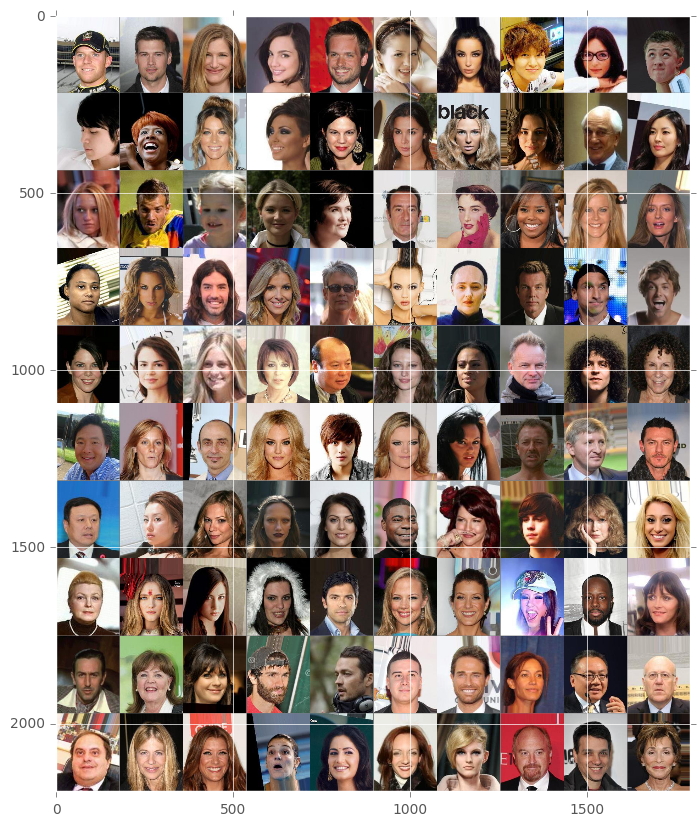

In [4]:
# Change the label to test different attributes
label='Eyeglasses'
#label='Wearing_Hat'
has_label=True
n_imgs=100
label_i = net['labels'].index(label)
label_idxs = np.where(net['attributes'][:, label_i] == has_label)[0]
label_idxs = label_idxs[:n_imgs]
#label_idxs = np.random.permutation(label_idxs)[:n_imgs]
vgg_imgs = [plt.imread(files[img_i])/255.0
        for img_i in label_idxs]

# indices with true eyeglasses : 8, 34, 
# indices with true hats : 6, 18, 23, 
m = utils.montage(vgg_imgs, 'imgs/test_eyeglasses.png')
plt.figure(figsize=(10, 10))
plt.imshow(m)

<a name="new_dataset_building"></a>
## II- New datasets building
Here, I chose to build two datasets: one of faces with true eyeglasses and another of faces with true hats.
They will help us create new more reliable attribute vectors, as we have true features in each image. For this I chose a set of at least 100 images with true eyeglasses or true hats in the Celeb dataset.

<a name="eyeglasses_dataset"></a>
### II.1- Eyeglasses dataset
First let's create the eyeglasses dataset : a set of faces with true eyeglasses from the celeb dataset. I choose mostly black eyeglasses.

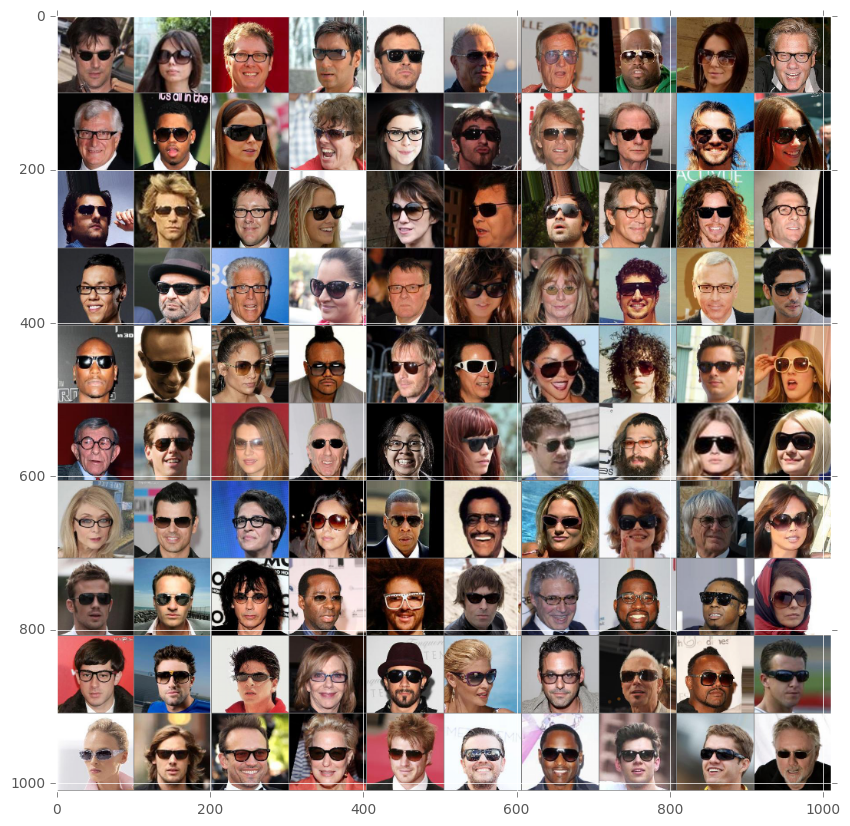

In [5]:
### The eyeglasses dataset 
dirname = './FacesWithGlasses/'
#dirname = './glasses/'
files = [os.path.join(dirname, fname)
             for fname in os.listdir(dirname)]

glasses_imgs = [plt.imread(files[img_i])
        for img_i in range(len(files))]

# Crop every image to a square
glasses_imgs = [utils.imcrop_tosquare(img_i) for img_i in glasses_imgs]

# Then resize the square image to 100 x 100 pixels
glasses_imgs = [resize(img_i, (100, 100)) for img_i in glasses_imgs]

m = utils.montage(glasses_imgs, 'imgs/FacesWithGlasses.png')
plt.figure(figsize=(10, 10))
plt.imshow(m)

- **The mean eyeglasses image**

Let's see what the mean eyeglasses is.

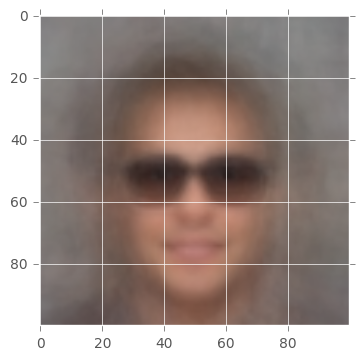

In [6]:
plt.imshow(np.mean(glasses_imgs, 0))

<a name="hats_dataset"></a>
### II.2- Hats dataset
Now we will do the same as above for the hats dataset.
Let's create the hats dataset.

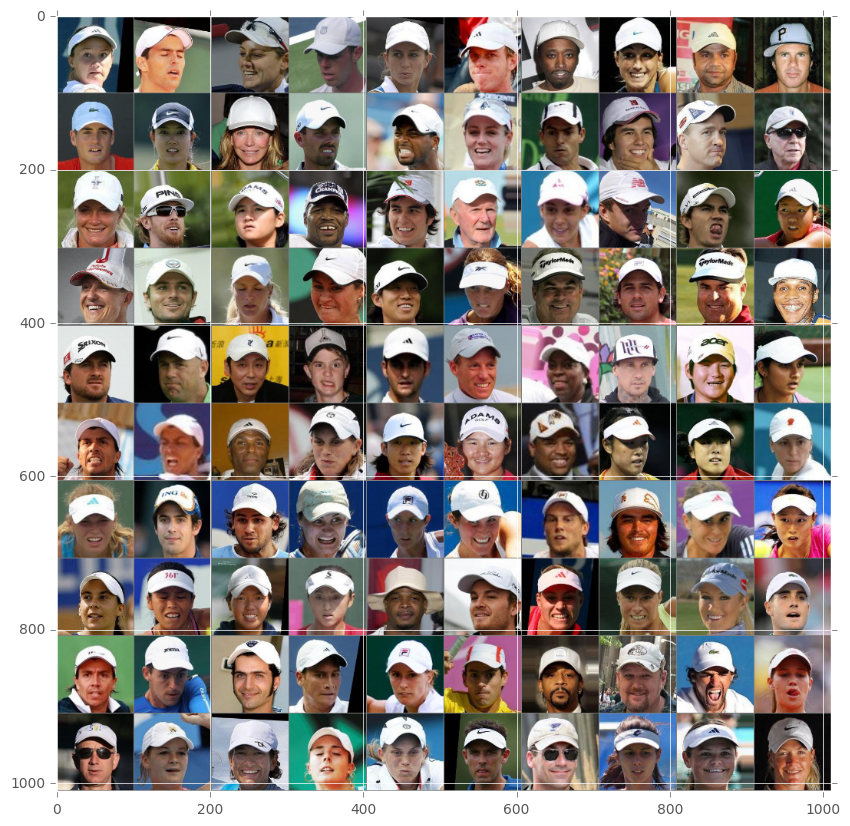

In [7]:
### The hats dataset
dirname = './FacesWithHats/'
#dirname = './hats2/'
files = [os.path.join(dirname, fname)
             for fname in os.listdir(dirname)]

hats_imgs = [plt.imread(files[img_i])
        for img_i in range(len(files))]

# Crop every image to a square
hats_imgs = [utils.imcrop_tosquare(img_i) for img_i in hats_imgs]

# Then resize the square image to 100 x 100 pixels
hats_imgs = [resize(img_i, (100, 100)) for img_i in hats_imgs]

m = utils.montage(hats_imgs, 'imgs/FacesWithHats.png')
plt.figure(figsize=(10, 10))
plt.imshow(m)

- **The mean hats image**

Let's see what the mean hats is.

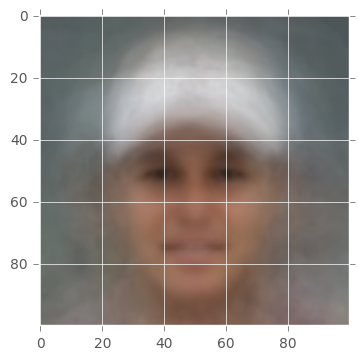

In [8]:
plt.imshow(np.mean(hats_imgs, 0))

<a name="Feature_function_creation"></a>
## III- Features function creation
At this step we have our dataset of eyeglasses and hats ready.
Now as explained above, I should rewrite the 'get_features_for' function to meet the new datasets requirements and generate the mean image. The next step will be the eyeglasses and hats vectors creation.

<a name="vgg_session_creation"></a>
### III.1- Creating a session for the VGG Model
**Let's create a session for the VGG Model and import the graph definition.**

In [9]:
#tf.reset_default_graph()
sess = tf.Session()
g = tf.get_default_graph()
tf.import_graph_def(net['graph_def'], name='net', input_map={
    'encoder/variational/random_normal:0': np.zeros(512, dtype=np.float32)})

<a name="vgg_model_placeholders"></a>
### III.2- Creating placeholders from the VGG Model
**And define the different placeholders (input, encoder, and generator).**

In [10]:
X = g.get_tensor_by_name('net/x:0')
Z = g.get_tensor_by_name('net/encoder/variational/z:0')
G = g.get_tensor_by_name('net/generator/x_tilde:0')

<a name="new_get_features_for"></a>
### III.3- Creating a new 'get_features_for' function
Now below the new 'get_features_for' function which will return the mean feature from a dataset of image. We could also set the number of images to use in the dataset.

In [11]:
def get_features_for(feature_img_directory='./FacesWithGlasses/', n_imgs=100):
    
    files = [os.path.join(feature_img_directory, fname)
             for fname in os.listdir(feature_img_directory)]
    
    files = files[:n_imgs]
    
    feature_imgs = [plt.imread(files[img_i])
        for img_i in range(len(files))]
    
    # Crop every image to a square
    feature_imgs = [utils.imcrop_tosquare(img_i) for img_i in feature_imgs]
    
    # Then resize the square image to 100 x 100 pixels
    feature_imgs = [resize(img_i, (100, 100)) for img_i in feature_imgs]

    preprocessed = np.array([CV.preprocess(img_i) for img_i in feature_imgs])
    zs = sess.run(Z, feed_dict={X: preprocessed})
    
    return np.mean(zs, 0)


<a name="generated_eyeglasses_feature"></a>
We will **use the mean feature we got from datasets using the new 'get_features_for' function to generate a new feature** through the VGG network. 
#### III.3.1- Generated eyeglasses feature
Let's generate the eyeglasses feature through the VGG network.

In [12]:
# The mean eyeglasses using the new 'get_features_for' function
z1 = get_features_for(feature_img_directory='./FacesWithGlasses/')

(1, 512)


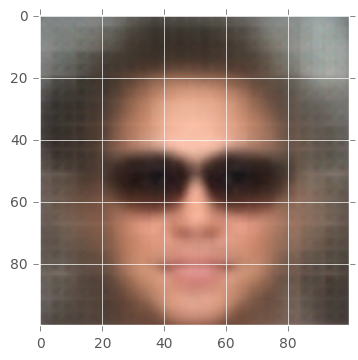

In [13]:
# The generated eyeglasses feature through the VGG network.
print(z1[np.newaxis].shape)
feature_generated = sess.run(G, feed_dict={Z: z1[np.newaxis]})
plt.imshow(feature_generated[0] / feature_generated.max())

<a name="generated_hats_feature"></a>
#### III.3.2- Generated hats feature
Let's generate the hats feature through the VGG network.

(1, 512)


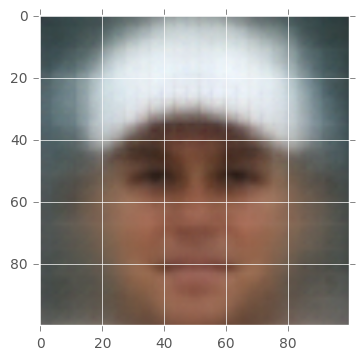

In [14]:
z3 = get_features_for(feature_img_directory='./FacesWithHats/')
print(z3[np.newaxis].shape)
feature_generated = sess.run(G, feed_dict={Z: z3[np.newaxis]})
plt.imshow(feature_generated[0] / feature_generated.max())

<a name="generated_mean_face"></a>
#### III.3.3- Generated mean face from the celeb dataset
We have above the generated eyeglasses and hats features through the network. As the VGG images sample used above has only 2 faces with True glasses we could use it for the mean of faces with no glasses.
This will be useful for vector creation in the next section.

(1, 512)


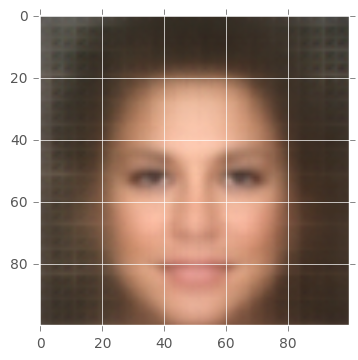

In [15]:
# Mean of faces with no glasses or hats.
z2 = get_features_for(feature_img_directory='./img_align_celeba/', n_imgs=100)
print(z2[np.newaxis].shape)
feature_generated = sess.run(G, feed_dict={Z: z2[np.newaxis]})
plt.imshow(feature_generated[0] / feature_generated.max())

<a name="features_on_faces"></a>
## IV- Putting features on faces
Now we will use generated features above to create vectors and put them on the faces.

<a name="on_whole_dataset"></a>
### IV.1- Using the whole celeb dataset images
In this part we will apply the generated and extracted features to the whole celeb dataset. We will use a random sample of 100 images from the celeb dataset for each test.

<a name="put_eyeglasses_feature"></a>
#### IV.1.1- For the eyeglasses feature

- **The glass vector**

We will create here the **glass vector** substracting the generated mean face from the generated eyeglasses feature. Like this we are sure to have only eyeglasses feature in the resulting vector. Indeed, the 100 first images of the celeb dataset contain only 2 true eyeglasses and 3 true hats. So their mean could be consider as people without eyeglass or hat.

In [16]:
# Remove the generated mean face (people without eyeglass) from the generated eyeglasses feature
glass_vector = z1 - z2

(1, 512)


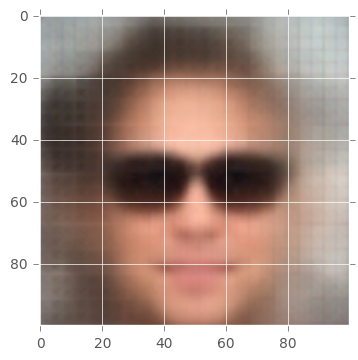

In [17]:
print(glass_vector[np.newaxis].shape)
generated_glass_vector = sess.run(G, feed_dict={Z: glass_vector[np.newaxis]})
plt.imshow(generated_glass_vector[0] / generated_glass_vector.max())

- **The synthetic unblur vector**

We will also reuse the **synthetic_unblur_vector** of the course.

In [18]:
from scipy.ndimage import gaussian_filter

idxs = np.random.permutation(range(len(celeb_files)))
imgs = [plt.imread(celeb_files[idx_i]) for idx_i in idxs[:100]]
blurred = []
for img_i in imgs:
    img_copy = np.zeros_like(img_i)
    for ch_i in range(3):
        img_copy[..., ch_i] = gaussian_filter(img_i[..., ch_i], sigma=3.0)
    blurred.append(img_copy)
    
    
# Now let's preprocess the original images and the blurred ones
imgs_p = np.array([CV.preprocess(img_i) for img_i in imgs])
blur_p = np.array([CV.preprocess(img_i) for img_i in blurred])

# And then compute each of their latent features
noblur = sess.run(Z, feed_dict={X: imgs_p})
blur = sess.run(Z, feed_dict={X: blur_p})

synthetic_unblur_vector = np.mean(noblur - blur, 0)

- **Applying glass vector on the Celeb dataset**

We could now try ***apply the effect of the new glass_vector on the Celeb dataset***. Specifically to a random sample of 100 images from the celeb dataset.

size celeb_files :  202599


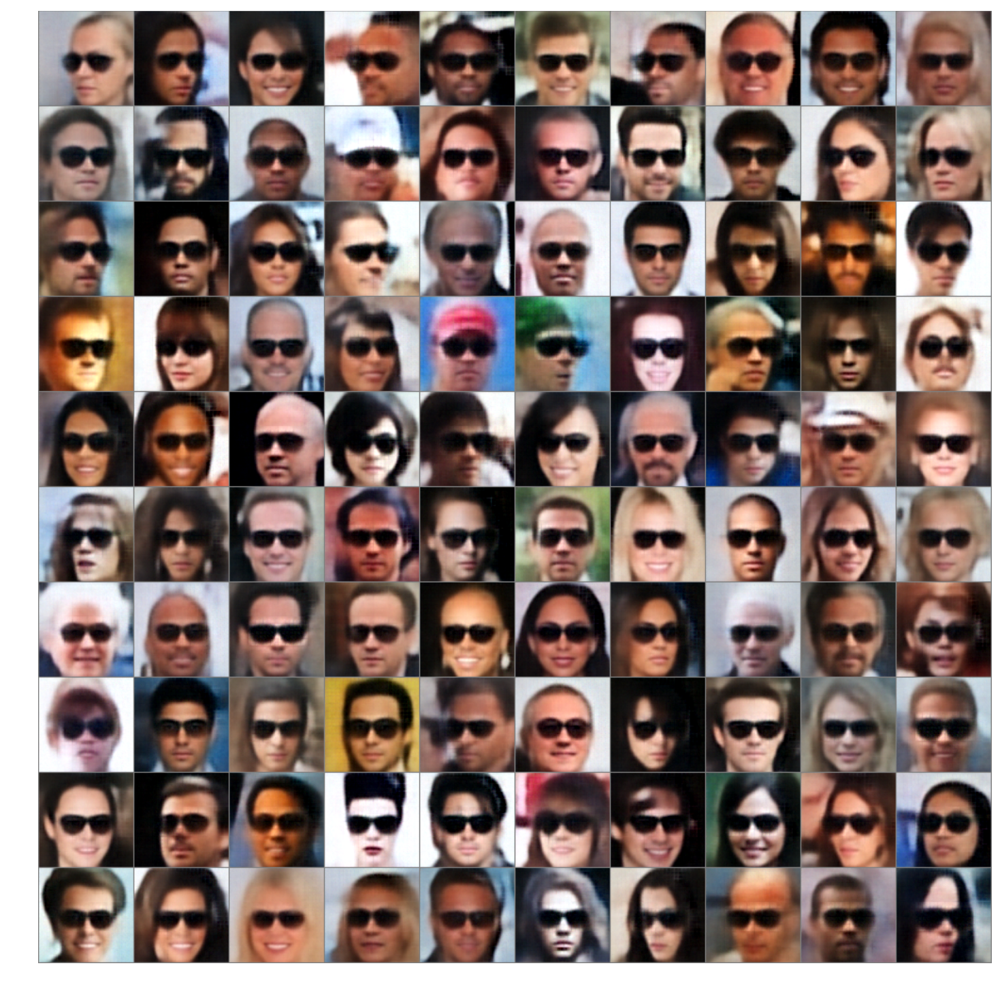

In [19]:
# Let's randomly choose a set of 100 faces on the Celeb dataset and try apply the effect of the glass_vector on.

#idxs = np.random.permutation(range(len(files)))
#imgs = [plt.imread(files[idx_i]) for idx_i in idxs[:100]]
#imgs_p = np.array([CV.preprocess(img_i) for img_i in imgs])
idxs = np.random.permutation(range(len(celeb_files)))
imgs = [plt.imread(celeb_files[idx_i]) for idx_i in idxs[:100]]
imgs_p = np.array([CV.preprocess(img_i) for img_i in imgs])
# Or only the line below
#imgs_p = np.array([CV.preprocess(img_i) for img_i in vgg_imgs])
print("size celeb_files : ", len(celeb_files))

z = sess.run(Z, feed_dict={X: imgs_p})

n_imgs = 5
amt = np.linspace(0, 1, n_imgs)
imgs = []
for amt_i in amt:
    zs = z + synthetic_unblur_vector * amt_i + amt_i * glass_vector + amt_i * glass_vector 
    #zs = z + amt_i * glass_vector + amt_i * glass_vector 
    g = sess.run(G, feed_dict={Z: zs})
    m = utils.montage(np.clip(g, 0, 1))
    imgs.append(m)
    
gif.build_gif(imgs=imgs, saveto='final_project_glass.gif')

Let's display the gif image to have a better view of the glass vector effect.

In [20]:
ipyd.Image(url='final_project_glass.gif?i={}'.format(
        np.random.rand()), height=1000, width=1000)

<a name="put_hats_feature"></a>
#### IV.1.2- For the hats  feature

- **The hat vector**

We will create here the hat vector substracting the generated mean face from the generated hats feature. Like this we are sure to have only hats feature in the resulting vector. Indeed, the 100 first images of the celeb dataset contain only 2 true eyeglasses and 3 true hats. So their mean could be consider as people without eyeglass or hat.

In [21]:
# Remove the generated mean face (people without hat) from the generated hats feature
hat_vector = z3 - z2

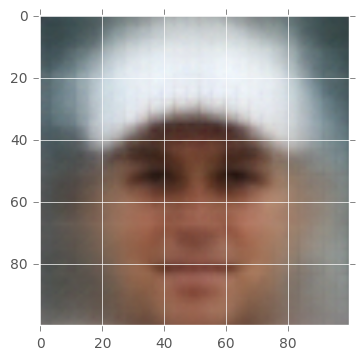

In [22]:
generated_hat_vector = sess.run(G, feed_dict={Z: hat_vector[np.newaxis]})
plt.imshow(generated_hat_vector[0] / generated_hat_vector.max())

- **Applying hat vector on the Celeb dataset**

We could now try ***apply the effect of the new hat_vector on the Celeb dataset***. Specifically to a random sample of 100 images from the celeb dataset.

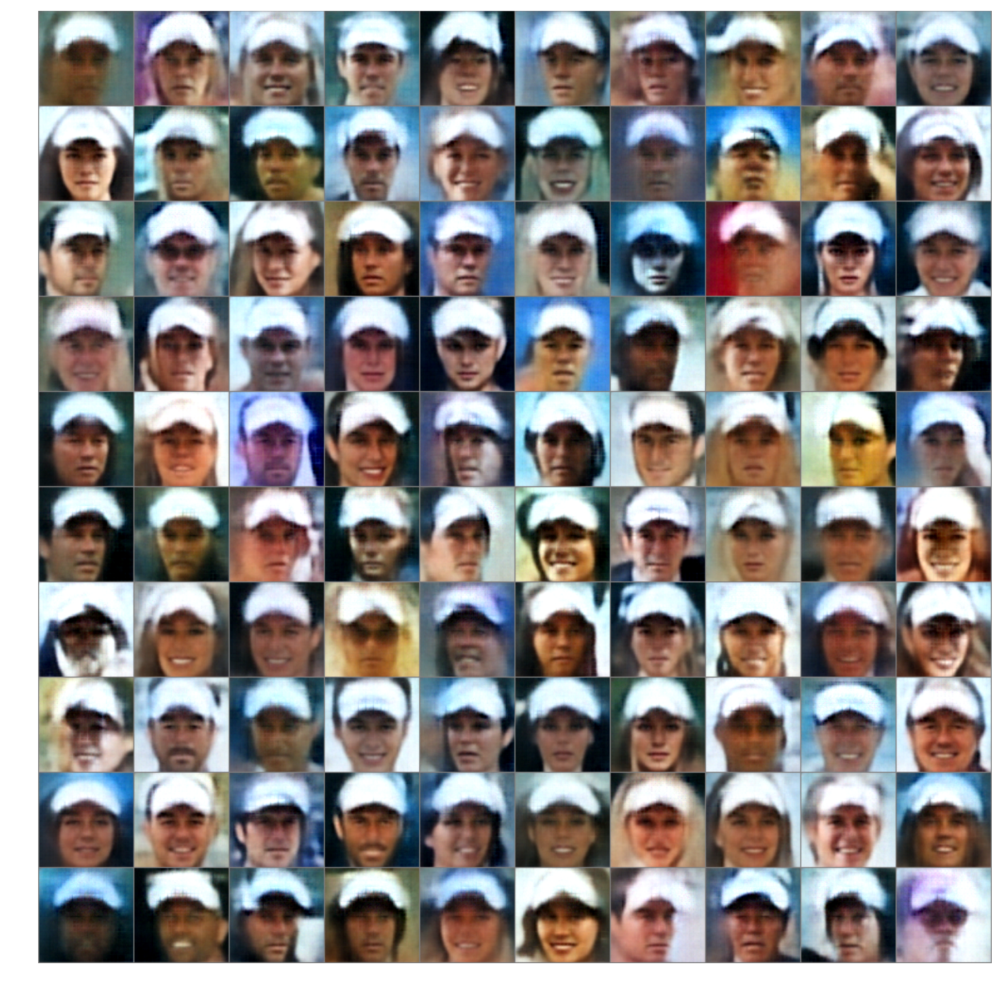

In [23]:
n_imgs = 5
amt = np.linspace(0, 1, n_imgs)

idxs = np.random.permutation(range(len(celeb_files)))
imgs = [plt.imread(celeb_files[idx_i]) for idx_i in idxs[:100]]
imgs_p = np.array([CV.preprocess(img_i) for img_i in imgs])
# Or only the line below
#imgs_p = np.array([CV.preprocess(img_i) for img_i in vgg_imgs])

z = sess.run(Z, feed_dict={X: imgs_p})
imgs = []
for amt_i in amt:
    zs = z + synthetic_unblur_vector * amt_i + amt_i * hat_vector + amt_i * hat_vector 
    #zs = z + amt_i * glass_vector + amt_i * glass_vector 
    g = sess.run(G, feed_dict={Z: zs})
    m = utils.montage(np.clip(g, 0, 1))
    imgs.append(m)
    
gif.build_gif(imgs=imgs, saveto='final_project_hats.gif')

Let's display the gif image to have a better view of the hat vector effect.

In [24]:
ipyd.Image(url='final_project_hats.gif?i={}'.format(
        np.random.rand()), height=1000, width=1000)

<a name="only_one_image"></a>
### IV.2- Using only one image
In this part we will apply the generated and extracted features to only on image of the celeb dataset or from other source. First, we will pick an image between a sample of 100 images from the celeb dataset for the test and finally I will apply the vector effect on my own face image.

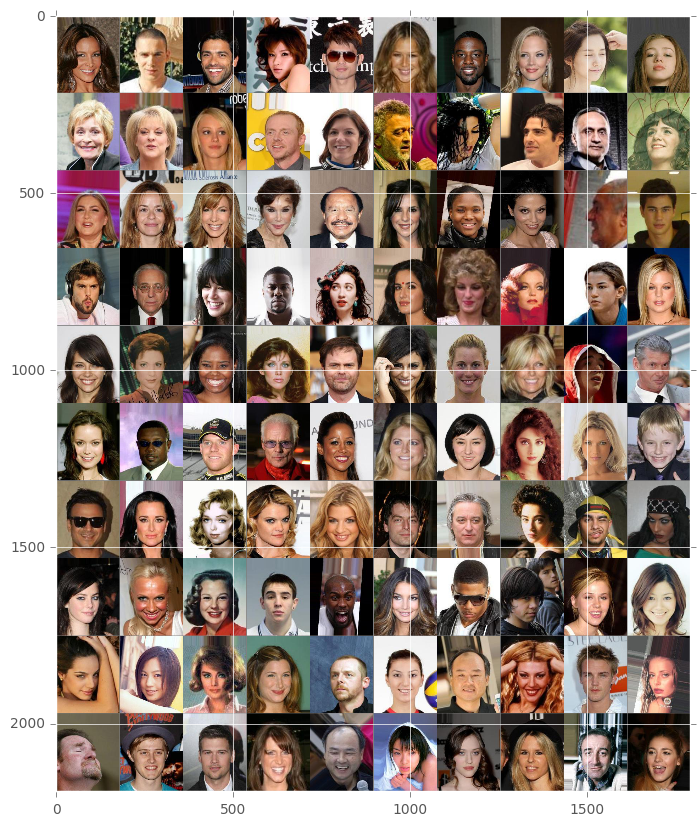

In [25]:
# Let's pick the first 100 images of the celeb dataset and pick one for the process
imgs = [plt.imread(celeb_files[idx_i])/255.0 for idx_i in range(100)]
m = utils.montage(imgs, 'imgs/100_celeb_images.png')
plt.figure(figsize=(10, 10))
plt.imshow(m)

Now let's generate and display the selected image. We could the difference between both.

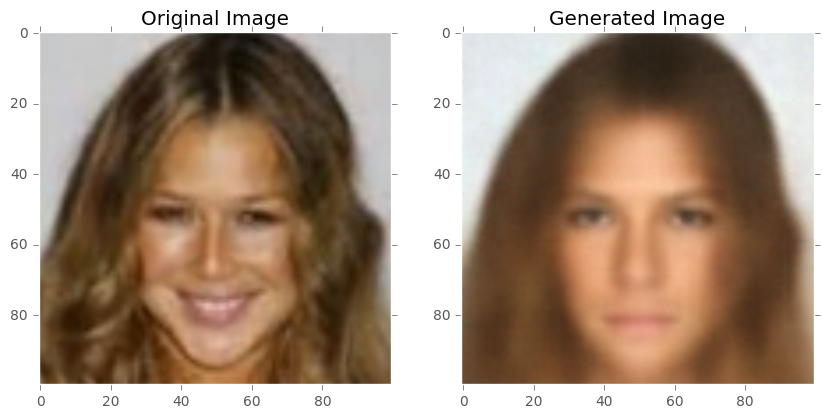

In [26]:
# Index of the selected image, we pick here the sixth image (index 5)
img = imgs[5]

img = CV.preprocess(img, crop_factor=1.0)[np.newaxis]

img_ = sess.run(G, feed_dict={X: img})
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(img[0]), axs[0].grid('off')
axs[0].set_title('Original Image')
axs[1].imshow(np.clip(img_[0] / np.max(img_), 0, 1)), axs[1].grid('off')
axs[1].set_title('Generated Image')

<a name="only_one_image_eyeglasses_feature"></a>
#### IV.2.1- For the eyeglasses feature

- **Applying glass vector on the selected one single image**

We could now try ***apply the effect of the glass_vector on the selected image***. Specifically to the generated image from this image through the VGG network.

6


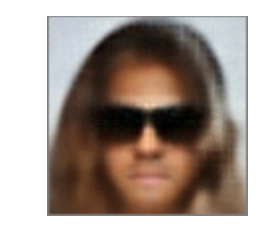

In [27]:
# According to the nb_iteration and the linspace we could have very different results
# We have to tune fine to get something very cool.

z = sess.run(Z, feed_dict={X: img})
n_imgs = 5
#amt = np.linspace(-1.5, 2.5, n_imgs)
#amt = np.linspace(0, 1, n_imgs)
amt = np.linspace(-1.5, 2.5, n_imgs)
zs = np.array([z[0] + hat_vector * amt_i for amt_i in amt])

nb_iteration = 2

# We first put the selected image in the list for future comparison
img_list = [plt.imread(celeb_files[5])]
#img_list = []

for amt_i in amt:
    
    i=0
    while i < nb_iteration:
        if i==0:
            z += synthetic_unblur_vector * amt_i
        else:
            #z += amt_i * hat_vector 
            z += amt_i * glass_vector
        i += 1
        
    zs = z
    
    
    g = sess.run(G, feed_dict={Z: zs})
    m = utils.montage(np.clip(g, 0, 1))
    img_list.append(m)    

print(len(img_list))
#plt.imshow(img_list[3])


gif.build_gif(imgs=img_list, saveto='final_project_glasses_one.gif')

Let's display the gif image to have a better view of the glass vector effect.

In [28]:
ipyd.Image(url='final_project_glasses_one.gif?i={}'.format(
        np.random.rand()), height=200, width=200)

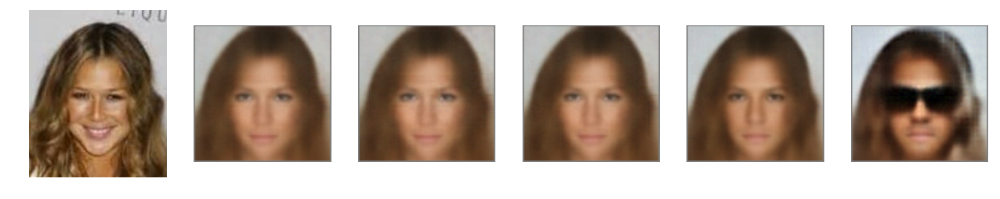

In [29]:
# Let's compare the original image with the generated ones.
fig, axs = plt.subplots(1, len(img_list), figsize=(20, 4))
for i, ax_i in enumerate(axs):
    ax_i.imshow(img_list[i])
    ax_i.grid('off')
    ax_i.axis('off')

<a name="both_eyeglasses_hats_feature"></a>
#### IV.2.2- For both the eyeglasses and hats features

- **Applying glass vector and hat vector on the selected one single image**

Now we will try ***apply the effect of both the glass_vector and hat_vector on the selected image***. Specifically to the generated image from this image through the VGG network.

6


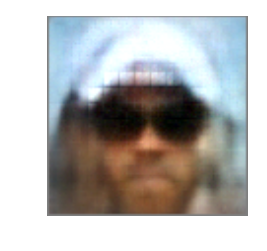

In [30]:
# According to the nb_iteration and the linspace we could have very different results
# We have to tune fine to get something very cool.

z = sess.run(Z, feed_dict={X: img})
n_imgs = 5
#amt = np.linspace(-1.5, 2.5, n_imgs)
#amt = np.linspace(0, 1, n_imgs)
amt = np.linspace(-1.5, 2.5, n_imgs)
zs = np.array([z[0] + hat_vector * amt_i for amt_i in amt])

nb_iteration = 2

# We first put the selected image in the list for future comparison
img_list = [plt.imread(celeb_files[5])]

for amt_i in amt: 
    i=0
    while i < nb_iteration:
        if i==0:
            z += synthetic_unblur_vector * amt_i
        else:
            z += amt_i * glass_vector + amt_i * hat_vector * 0.8
        i += 1
        
    zs = z
    
    g = sess.run(G, feed_dict={Z: zs})
    m = utils.montage(np.clip(g, 0, 1))
    img_list.append(m)    

print(len(img_list))
#plt.imshow(img_list[3])

gif.build_gif(imgs=img_list, saveto='final_project_glasses_hats_one.gif')

Let's display the gif image to have a better view of the glass and hat vector effect.

In [31]:
ipyd.Image(url='final_project_glasses_hats_one.gif?i={}'.format(
        np.random.rand()), height=200, width=200)

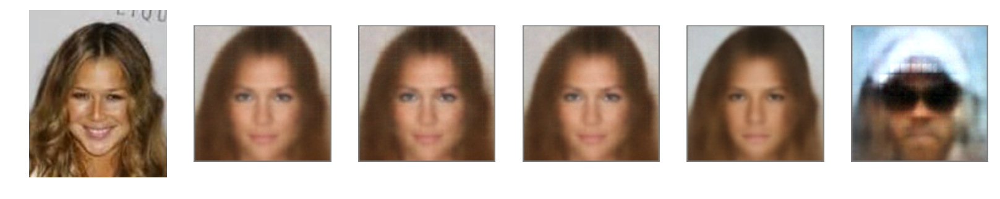

In [32]:
# Let's compare the original image with the generated ones.
fig, axs = plt.subplots(1, len(img_list), figsize=(20, 4))
for i, ax_i in enumerate(axs):
    ax_i.imshow(img_list[i])
    ax_i.grid('off')
    ax_i.axis('off')

<a name="own_image"></a>
#### IV.2.3- An example with my own face image

**Now to finish, I try all with my own image**.

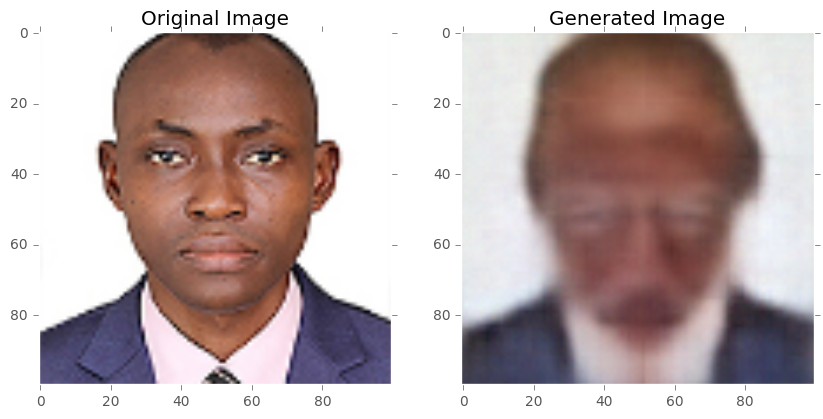

In [33]:
img_jc = plt.imread('jc_blended.png')[..., :3]
#img = imgs[32]
img_jc = CV.preprocess(img_jc, crop_factor=1.0)[np.newaxis]

img_ = sess.run(G, feed_dict={X: img_jc})
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(img_jc[0]), axs[0].grid('off')
axs[0].set_title('Original Image')
axs[1].imshow(np.clip(img_[0] / np.max(img_), 0, 1)), axs[1].grid('off')
axs[1].set_title('Generated Image')

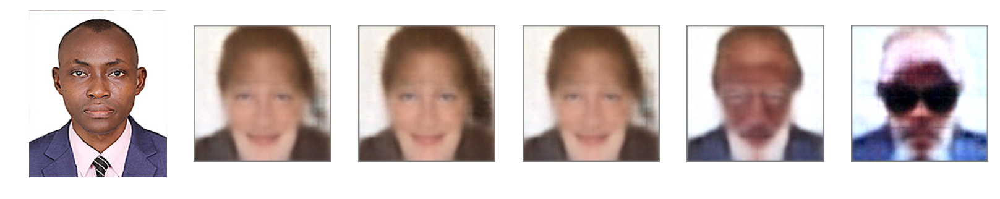

In [34]:
# According to the nb_iteration and the linspace we could have very different results
# We have to tune fine to get something very cool.

z = sess.run(Z, feed_dict={X: img_jc})
n_imgs = 5
amt = np.linspace(-1.5, 2.5, n_imgs)
zs = np.array([z[0] + hat_vector * amt_i for amt_i in amt])

nb_iteration = 2

# We first put the selected image in the list for future comparison
img_list = [plt.imread('jc_blended.png')[..., :3]]
#img_list = []

for amt_i in amt:
    
    i=0
    while i < nb_iteration:
        if i==0:
            z += synthetic_unblur_vector * amt_i
        else:
            #z += amt_i * hat_vector 
            z += amt_i * glass_vector + amt_i * hat_vector * 0.5
        i += 1
        
    zs = z
    
    g = sess.run(G, feed_dict={Z: zs})
    m = utils.montage(np.clip(g, 0, 1))
    img_list.append(m)    

    
# Let's compare the original image with the generated ones.
fig, axs = plt.subplots(1, len(img_list), figsize=(20, 4))
for i, ax_i in enumerate(axs):
    ax_i.imshow(img_list[i])
    ax_i.grid('off')
    ax_i.axis('off')

<a name="conclusion"></a>
## CONCLUSION
- For the feature vectors creation I remark that we have better results for more uniform data. For example a lot of sun glasses of the same type will have a better mean image than a mixture. The same idea for hats, we should have a better result for hats of same type and color.
- Once you have the desired input data, you should also fine tune parameters to produce something very cool.
- This was a awesome experience for me as it opens my view on the unexplored possibilities of this field, and I will be glad to apply the DCGAN and generally deep network to projects I personally plan to do later. For example :
        - 3D images or avatar generation from "Learning Detailed Face Reconstruction from a Single Image" research paper by Elad Richardson, Matan Sela, Roy Or-El, Ron Kimmel. 15 Nov 2016.
https://arxiv.org/pdf/1611.05053v1
        - 3D images or avatar generation from "Face Synthesis from Facial Identity Features" research paper by Forrester Cole, David Belanger, Dilip Krishnan, Aaron Sarna, Inbar Mosseri, William T. Freeman. 17 Jan 2017.
https://arxiv.org/pdf/1701.04851v1
        - Or "Generate Audio Video from silent video (Lips reading)" using "Vid2speech Speech Reconstruction from Silent Video" research paper by Ariel Ephrat and Shmuel Peleg. 9 Jan 2017.
https://arxiv.org/pdf/1701.00495v2